# Text Data Analysis

In [1]:
import json
import pandas as pd
import spacy
from tqdm import tqdm
import nltk
import flair
import gensim
import umap
import numpy as np
import plotly.express as px
import transformers

/Users/shaunkhoo/Documents/Code/NUS/nus-dsa4264-materials/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 1. Hansard Data

In this section, we explore Hansard data, which consists of speeches and debates made in Singapore's Parliament Chamber and provides a record of parliamentary business and proceedings in a Sitting. Data from Hansard has already been scraped for you, focusing specifically on the Committee of Supply (or Budget) debates for the 14th Parliament (from 2021 to present). We will use this as an opportunity to explore sentiment analysis and topic modelling.

### 1.1 Importing the data and doing simple processing

In [2]:
# Read in the Hansard data
hansard_df = pd.read_csv("Hansard_15th_Parl_COS.csv")

In [3]:
print(hansard_df.shape)
hansard_df.head()

(4911, 10)


,Parliament No,Session No,Volume No,Sitting No,Sitting Date,Section Name,Title,MPs Speaking,Speaker,Speech
0,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",The Chairman,"Head V, Ministry of Trade and Industry. Mr Lia..."
1,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",Mr Liang Eng Hwa (Bukit Panjang),"Mr Chairman, I beg to move, ""That the total su..."
2,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",Ms Foo Mee Har (West Coast),"Mr Chairman, an MOM report shows that job vaca..."
3,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",Ms Mariam Jaafar (Sembawang),"Sir, the investments in building new capabilit..."
4,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",The Chairman,Ms Sylvia Lim. Not here. Ms Janet Ang. Not her...


Let's try to enrich this dataset with some useful variables. 

<span style="background-color: #FFFF00; color: #000000">**Exercise:** Create two new columns for this dataset: 
* `Sitting Year` (int): Year in which the speech was given
* `Speech Length` (int): Number of words in the speech </span>

In [4]:
hansard_df['Sitting Year'] = hansard_df['Sitting Date'].str.slice(-4).astype('int')
hansard_df['Speech Length'] = hansard_df['Speech'].apply(lambda x: len(x.split()))

In [5]:
hansard_df.head()

,Parliament No,Session No,Volume No,Sitting No,Sitting Date,Section Name,Title,MPs Speaking,Speaker,Speech,Sitting Year,Speech Length
0,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",The Chairman,"Head V, Ministry of Trade and Industry. Mr Lia...",2022,11
1,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",Mr Liang Eng Hwa (Bukit Panjang),"Mr Chairman, I beg to move, ""That the total su...",2022,889
2,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",Ms Foo Mee Har (West Coast),"Mr Chairman, an MOM report shows that job vaca...",2022,409
3,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",Ms Mariam Jaafar (Sembawang),"Sir, the investments in building new capabilit...",2022,172
4,14,1,95,53,3-3-2022,Budget,Committee of Supply – Head V (Ministry of Trad...,"Mr Don Wee (Chua Chu Kang),Mr Derrick Goh (Nee...",The Chairman,Ms Sylvia Lim. Not here. Ms Janet Ang. Not her...,2022,13


<Axes: ylabel='Frequency'>

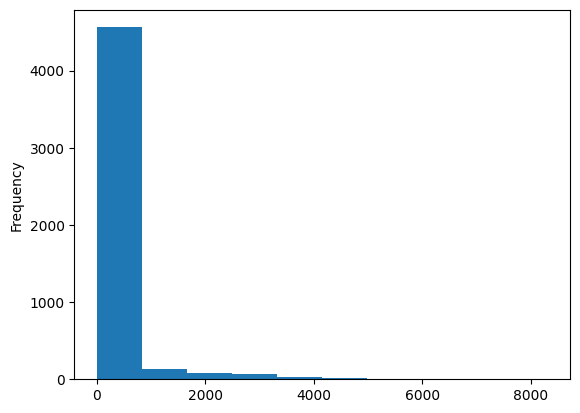

In [6]:
hansard_df['Speech Length'].plot.hist()

### 1.2 Sentiment Analysis

Let's start with applying some sentiment analysis. While most Parliamentary speeches are likely to be quite mild in terms of sentiment, we might be able to identify some more impassioned speeches. Before you proceed, make sure you have both the `spacy` and `spacytextblob` libraries installed.

In [7]:
# Run the command here to download textblob's additional corpuses
!python -m textblob.download_corpora
!python -m spacy download en_core_web_sm

[nltk_data] Downloading package brown to /Users/shaunkhoo/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package conll2000 to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!
[nltk_data] Downloading package movie_reviews to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Unzipping corpora/movie_reviews.zip.
Finished.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 18.4 MB/s eta 0:00:000

In [8]:
from spacytextblob.spacytextblob import SpacyTextBlob

# Initialise the NLP pipeline and add the spacetextblob step to the pipeline
nlp = spacy.load('en_core_web_sm')
nlp.add_pipe('spacytextblob')

# Add our texts
texts = hansard_df['Speech']

# This will take about 20-30 seconds to run
sentiment_results = []
for doc in nlp.pipe(texts, disable=["tok2vec", "tagger", "ner", "parser", "attribute_ruler", "lemmatizer"]):
    sentiment_results.append({
        'Polarity': doc._.blob.polarity,
        'Subjectivity': doc._.blob.subjectivity, 
    })

In [9]:
# Now we append it to our original dataset
sentiment_results_df = pd.DataFrame(sentiment_results)
hansard_df = pd.concat([hansard_df, sentiment_results_df], axis = 1)

Let's do some simple data analysis to understand the distributions of the polarity and subjectivity scores. Before you run the cells below, think carefully about what you expect from the data.

<Axes: ylabel='Frequency'>

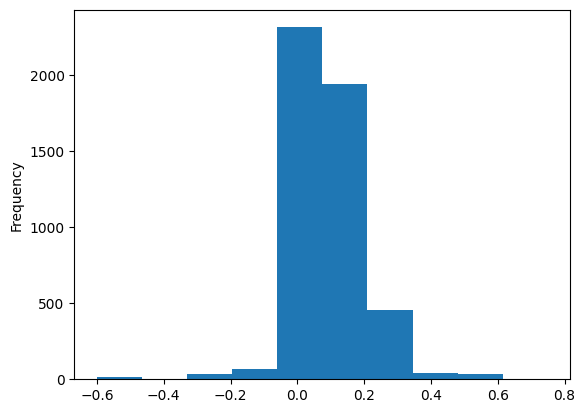

In [10]:
# Polarity scores range from [-1 to 1], with -1 indicating very negative and 1 indicating very positive
hansard_df['Polarity'].plot.hist()

<Axes: ylabel='Frequency'>

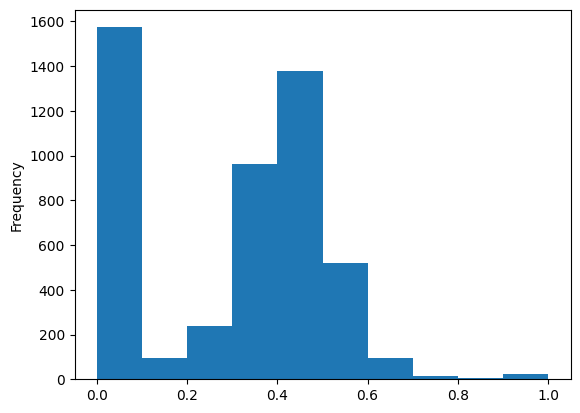

In [11]:
# Subjectivity scores range from [0 to 1], with 0 indicating very objective and 1 indicating very subjective
hansard_df['Subjectivity'].plot.hist()

Unsurprisingly most texts are neutral and objective. But this may be swayed by the number of times the Chairman speaks. Let's filter that out and look at this again.

In [12]:
hansard_df_cleaned = hansard_df[hansard_df['Speaker'] != "The Chairman"].reset_index(drop = True).copy()

<Axes: ylabel='Frequency'>

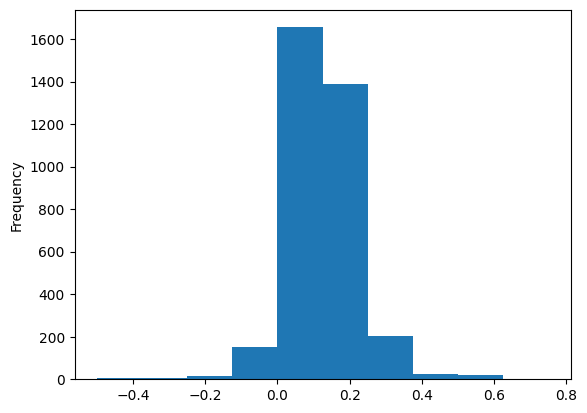

In [13]:
# Polarity scores range from [-1 to 1], with -1 indicating very negative and 1 indicating very positive
hansard_df_cleaned['Polarity'].plot.hist()

<Axes: ylabel='Frequency'>

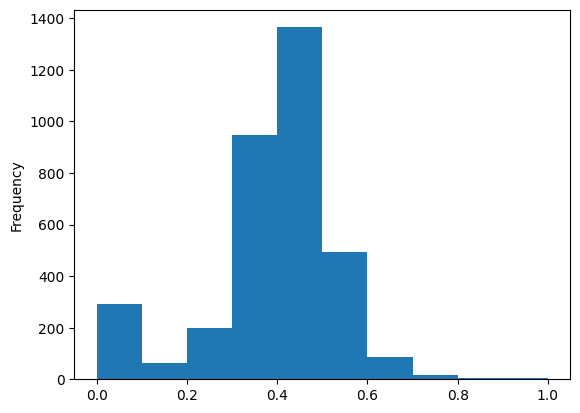

In [14]:
# Subjectivity scores range from [0 to 1], with 0 indicating very objective and 1 indicating very subjective
hansard_df_cleaned['Subjectivity'].plot.hist()

Let's find the most positive speech and the most negative speech! Share your thoughts about the results

In [15]:
hansard_df_cleaned.loc[hansard_df_cleaned['Polarity'].idxmin()]

Parliament No                                                   14
Session No                                                       1
Volume No                                                       95
Sitting No                                                      88
Sitting Date                                             28-2-2023
Section Name                                                Budget
Title            Committee of Supply – Head Q (Ministry of Comm...
MPs Speaking     Mr Christopher de Souza (Holland-Bukit Timah),...
Speaker                                            Mr Tan Kiat How
Speech                          Do you mind repeating? I am sorry.
Sitting Year                                                  2023
Speech Length                                                    7
Polarity                                                      -0.5
Subjectivity                                                   1.0
Name: 2150, dtype: object

In [16]:
hansard_df_cleaned.loc[hansard_df_cleaned['Polarity'].idxmax()]

Parliament No                                                   14
Session No                                                       1
Volume No                                                       95
Sitting No                                                      91
Sitting Date                                              3-3-2023
Section Name                                                Budget
Title            Committee of Supply – Head I (Ministry of Soci...
MPs Speaking     Ms Denise Phua Lay Peng (Jalan Besar),Mr Seah ...
Speaker                                    Ms Denise Phua Lay Peng
Speech           So, for ComLink to be successful, there must b...
Sitting Year                                                  2023
Speech Length                                                   13
Polarity                                                      0.75
Subjectivity                                                  0.95
Name: 1229, dtype: object

Both of these speeches seem a bit short, which might explain their extreme polarity scores. Let's plot a scatter plot to highlight the relationship between speech length and polarity.

<Axes: xlabel='Speech Length', ylabel='Polarity'>

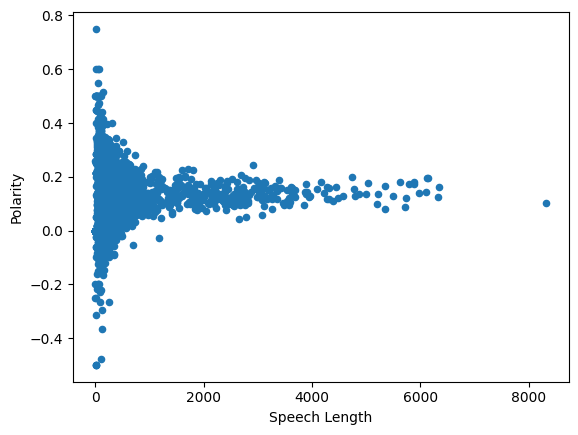

In [17]:
hansard_df_cleaned.plot.scatter(x = 'Speech Length', y = 'Polarity')

<span style="background-color: #FFFF00; color: #000000">**Class Discussion:** Given that `textblob` is a dictionary-based approach to sentiment analysis, can you think of why longer speeches tend to have less extreme values for positive/negative sentiment?</span>

Now let's try a different approach: using an embedding-based classifier instead! We will use a small embedding-based classifier that has already been finetuned to save time.

In [18]:
from flair.nn import Classifier
from flair.data import Sentence
tagger = Classifier.load('./flair_sentiment.pt')

In [19]:
# Let's try it out with a random speech
sentence = Sentence(hansard_df_cleaned['Speech'][2])
tagger.predict(sentence)
print(sentence)

Sentence[188]: "Sir, the investments in building new capabilities, strengthening local enterprises and investing in our people signal our Government's commitment to enhancing the competitiveness of our domestic economy and helping companies to digitalise and globalise. But it will take time for the impact of these measures to be felt in a large flow economy like ours while there are many nearer-term headwinds to global trade and economic recovery. Competition for investments can also be expected to intensify, especially in a post-COVID-19, post-BEPS 2.0 world where companies are refining their global and regional games. EDB has done remarkably well during the pandemic years. As the world emerges from the pandemic, how does the investment pipeline look going forward? How can Singapore extract value quickly from the recently completed trade agreements? Can the Government give an update on progress in facilitating cross border data flows and digital trade? How else can the Government enha

In [70]:
sentiment_scores = []

# This should take around 3-5 minutes
for text in tqdm(hansard_df_cleaned['Speech'].tolist()):
    sentence = Sentence(text)
    tagger.predict(sentence)

    # Remember to take the inverse of the negative score
    if sentence.labels[0].value == 'NEGATIVE':
        sentiment_scores.append(1 - sentence.labels[0].score)
    else:
        sentiment_scores.append(sentence.labels[0].score)

100%|██████████| 3471/3471 [02:27<00:00, 23.48it/s]


In [71]:
hansard_df_cleaned['Sentiment'] = sentiment_scores

<Axes: ylabel='Frequency'>

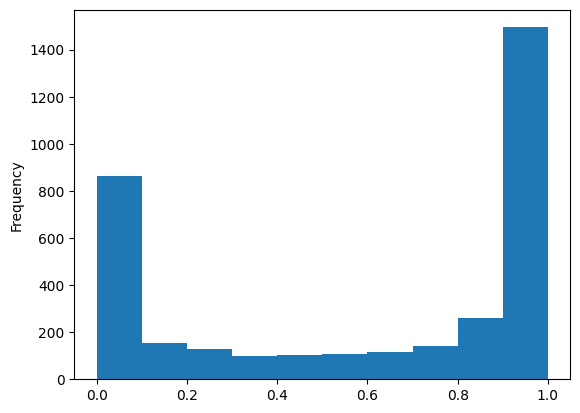

In [72]:
hansard_df_cleaned['Sentiment'].plot.hist()

<span style="background-color: #FFFF00; color: #000000">**Class Discussion:** What do you notice about this chart that is different from the `textblob` model results? Why do you think there is such a big difference?</span>

<Axes: xlabel='Speech Length', ylabel='Sentiment'>

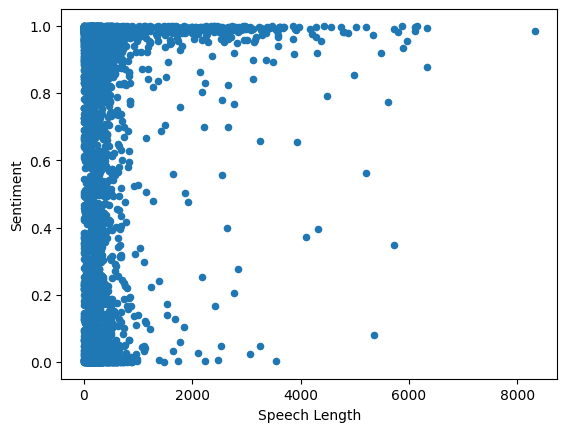

In [73]:
hansard_df_cleaned.plot.scatter(x = 'Speech Length', y = 'Sentiment')

In [74]:
hansard_df_cleaned.loc[hansard_df_cleaned['Sentiment'].idxmin()]['Speech']

'Sir, for the past few years, I have been asking HDB to review the policy of not allowing singles to rent flats on their own. This is especially so for elderly singles, some of whom are divorcees or estranged from their spouse or children. For this group of people, due to their age and behaviour, they just cannot get along with another person in the same rental flat. I have come across cases where HDB pairs two total strangers to rent a 1-room flat. However, they are not able to get along with each other due to different habits, different hygiene practices or medical conditions. As a result, sometimes, they quarrel with each other. Sometimes, one of them will move out and sleep at the void deck to avoid further quarrels. Last December, HDB launched the JSS-OR pilot whereby an operator, which is a social service agency, will try to pair up single applicants for rental flats. It has been four months since. May I ask MND for an update on this Joint Singles Scheme Operator-Run Pilot? How m

### 1.3 Topic modelling

Since Parliamentary debates tend to be quite topic-focused, topic modelling would be a good option for us to better understand the ongoing debates and to get a sense of the priority areas for discussion in Parliament.

In [25]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string

# Download necessary NLTK data
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('stopwords')

# Initialize stopwords and lemmatizer
stop_words = set(stopwords.words('english'))
stop_words.update(['also', 'mr', 'chairman', 'beg', 'move'])
lemmatizer = WordNetLemmatizer()

def preprocess(text):
    # Tokenization
    words = word_tokenize(text.lower())
    
    # Remove punctuation and non-alphabetic tokens
    words = [word for word in words if word.isalpha()]
    
    # Stopword removal and lemmatization
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    
    return ' '.join(words)

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/shaunkhoo/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [26]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

# Step 1: Preprocessing (with stopword removal and lemmatization)
texts_preprocessed = [preprocess(text) for text in hansard_df_cleaned['Speech']]

# Step 2: Vectorizing the text data
vectorizer = CountVectorizer()
dtm = vectorizer.fit_transform(texts_preprocessed)

# Step 3: Applying LDA for Topic Modeling
lda = LatentDirichletAllocation(n_components = 10, random_state = 2024)
lda.fit(dtm)

# Step 4: Extracting and Displaying Topics
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")
        print(", ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

no_top_words = 10
tf_feature_names = vectorizer.get_feature_names_out()
display_topics(lda, tf_feature_names, no_top_words)

Topic 0:
worker, work, job, employer, support, year, workforce, company, need, government
Topic 1:
community, youth, support, year, mental, need, singapore, programme, issue, effort
Topic 2:
art, sport, singapore, community, heritage, year, culture, national, mccy, plan
Topic 3:
case, legal, resident, year, dispute, law, court, community, officer, singapore
Topic 4:
singapore, digital, singaporean, country, defence, year, world, minister, asean, pandemic
Topic 5:
minister, question, would, think, thank, member, one, point, public, government
Topic 6:
healthcare, health, care, patient, public, hawker, need, year, centre, many
Topic 7:
support, student, family, school, need, programme, child, year, learning, skill
Topic 8:
flat, hdb, housing, family, year, rental, home, scheme, need, singaporean
Topic 9:
singapore, business, government, sector, new, green, industry, company, technology, digital


The topics looks fairly sensible, but is there a way for us to get a more tangible and concrete way to assess the quality of this topic modelling? We can look at the **coherence score** for this task.

In [27]:
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary

# Step 1: Create a Gensim Dictionary and Corpus
texts_tokenized = [text.split() for text in texts_preprocessed]
dictionary = Dictionary(texts_tokenized)
corpus = [dictionary.doc2bow(text) for text in texts_tokenized]

# Step 2: Get the topics from the LDA model
lda_topics = lda.components_
lda_topics_words = [[vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-10 - 1:-1]] for topic in lda_topics]

# Step 3: Calculate Coherence Score
coherence_model_lda = CoherenceModel(topics = lda_topics_words, 
                                     texts = texts_tokenized, 
                                     dictionary = dictionary, 
                                     coherence = 'c_v')

coherence_lda = coherence_model_lda.get_coherence()
print(f'Coherence Score for LDA Model: {coherence_lda}')

Coherence Score for LDA Model: 0.49953268901083847


Now let's try varying some of the parameters to see which gets us the optimal coherence score. We'll start by adjusting the number of topics.

In [28]:
n_topics_list = [3, 5, 10, 15, 20, 25]
coherence_scores = []

# It should take around 15-30 seconds for each iteration
for n_topics in tqdm(n_topics_list):
        
    lda = LatentDirichletAllocation(n_components = n_topics, random_state = 2024)
    lda.fit(dtm)
    lda_topics = lda.components_
    lda_topics_words = [[vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-10 - 1:-1]] for topic in lda_topics]    
    coherence_model_lda = CoherenceModel(topics = lda_topics_words, 
                                         texts = texts_tokenized, 
                                         dictionary = dictionary, 
                                         coherence = 'c_v')    
    coherence_lda = coherence_model_lda.get_coherence()
    print(f"Number of topics: {n_topics} | Coherence Score: {coherence_lda}")
    coherence_scores.append(coherence_lda)

 17%|█▋        | 1/6 [00:13<01:05, 13.08s/it]

Number of topics: 3 | Coherence Score: 0.4083455399385279


 33%|███▎      | 2/6 [00:26<00:54, 13.55s/it]

Number of topics: 5 | Coherence Score: 0.44750575818754124


 50%|█████     | 3/6 [00:42<00:43, 14.53s/it]

Number of topics: 10 | Coherence Score: 0.49953268901083847


 67%|██████▋   | 4/6 [00:58<00:30, 15.25s/it]

Number of topics: 15 | Coherence Score: 0.5049288295230864


 83%|████████▎ | 5/6 [01:16<00:15, 15.95s/it]

Number of topics: 20 | Coherence Score: 0.536657912871302


100%|██████████| 6/6 [01:34<00:00, 15.73s/it]

Number of topics: 25 | Coherence Score: 0.5298112504487473


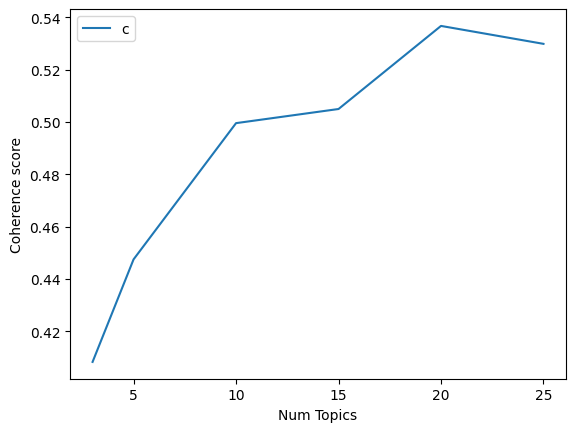

In [29]:
import matplotlib.pyplot as plt
plt.plot(n_topics_list, coherence_scores)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [30]:
lda = LatentDirichletAllocation(n_components = 20, random_state = 2024)
lda.fit(dtm)
no_top_words = 10
tf_feature_names = vectorizer.get_feature_names_out()
display_topics(lda, tf_feature_names, no_top_words)

Topic 0:
minister, would, think, time, member, thank, question, want, one, like
Topic 1:
community, youth, programme, support, religious, year, volunteer, issue, need, singapore
Topic 2:
art, sport, singapore, heritage, culture, mccy, national, year, community, support
Topic 3:
resident, community, issue, hdb, neighbour, neighbourhood, case, noise, dispute, town
Topic 4:
singapore, country, asean, defence, singaporean, year, world, foreign, minister, china
Topic 5:
question, public, parliament, government, one, would, many, member, people, woman
Topic 6:
transport, bus, public, road, lta, commuter, would, path, year, safety
Topic 7:
student, school, support, child, family, education, need, learning, programme, moe
Topic 8:
flat, hdb, housing, family, rental, year, scheme, home, need, single
Topic 9:
digital, service, public, community, singapore, government, need, plan, senior, singaporean
Topic 10:
government, shop, business, mof, tender, contract, cost, tax, procurement, coffee
Topic

In [31]:
# Step 1: Get the topic distribution for each document
lda_topic_distributions = lda.transform(dtm)

# Step 2: Identify the dominant topic for each document
dominant_topics = np.argmax(lda_topic_distributions, axis = 1)

# Step 3: Apply UMAP to reduce to 2 dimensions
umap_model = umap.UMAP(n_components = 2, random_state = 2024)
lda_2d = umap_model.fit_transform(lda_topic_distributions)

# Step 4: Prepare data for Plotly
df = pd.DataFrame({
    'UMAP1': lda_2d[:, 0],
    'UMAP2': lda_2d[:, 1],
    'Dominant Topic': dominant_topics,
    'Text': hansard_df_cleaned['Speech'].str.slice(0,1000).tolist()  
})

# Step 5: Create custom hover template to control text width
hover_template = '<br>'.join(['%{customdata}'])

# Limiting the line width by adding line breaks after a specific number of characters (e.g., 50)
df['Text'] = df['Text'].apply(lambda x: '<br>'.join([x[i:i+50] for i in range(0, len(x), 50)]))

# Step 6: Create an interactive plot with Plotly
fig = px.scatter(
    df, x='UMAP1', y='UMAP2',
    color='Dominant Topic',
    custom_data=['Text'],  # Use custom data for hover template
    title='Interactive UMAP Projection of LDA Topic Distributions',
    color_continuous_scale=px.colors.qualitative.Set1
)

# Customize hover template to use our custom text formatting
fig.update_traces(
    hovertemplate=hover_template,
    marker=dict(size=8, opacity=0.7)
)

# Customize layout with specific dimensions
fig.update_layout(
    width = 1200,
    height = 800,
    legend_title_text='Dominant Topic',
    legend = dict(
        itemsizing='constant'
    )
)

# Show plot
fig.show()

/Users/shaunkhoo/Documents/Code/NUS/nus-dsa4264-materials/venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Now we try with another topic modelling approach: using embeddings with BERTopic. Note that BERTopic relies on hierarchical clustering, so we don't have to set any number of topics as a hyperparameter.

In [33]:
from bertopic import BERTopic

# Step 1: Initialize BERTopic
topic_model = BERTopic()

# Step 2: Fit the model to your data
topics, probabilities = topic_model.fit_transform(hansard_df_cleaned['Speech'].tolist())

# Step 3: View the topics
topics_overview = topic_model.get_topic_info()

In [34]:
topics_overview

,Topic,Count,Name,Representation,Representative_Docs
0,-1,698,-1_to_and_the_of,"[to, and, the, of, in, we, for, that, is, our]","[Mr Chairman, I thank the Government Parliamen..."
1,0,174,0_flats_hdb_housing_flat,"[flats, hdb, housing, flat, rental, the, for, ...","[Mr Chairman, the COVID-19 pandemic has affect..."
2,1,151,1_energy_green_carbon_climate,"[energy, green, carbon, climate, emissions, wi...","[Mdm Chairman, climate change is the defining ..."
3,2,105,2_digital_and_to_the,"[digital, and, to, the, data, of, in, our, dig...","[Mr Chairman, let me first start by thanking M..."
4,3,94,3_community_malaymuslim_m3_mendaki,"[community, malaymuslim, m3, mendaki, religiou...","[Mr Chairman, our Malay community can be proud..."
...,...,...,...,...,...
78,77,11,77_sustainability_green_schools_students,"[sustainability, green, schools, students, our...",[Singapore is embarking on the Green Plan 2030...
79,78,11,78_training_saf_covid19_safs,"[training, saf, covid19, safs, exercises, pand...","[Mr Chairman, Singapore faces threats around t..."
80,79,11,79_rd_research_innovation_economy,"[rd, research, innovation, economy, growth, de...","[Chairman, science and technology are instrume..."
81,80,11,80_yes_okay_repeating_pause,"[yes, okay, repeating, pause, here, sorry, sir...","[Yes, Sir., Yes., Yes.]"


BERTopic says we have 74 topics, which sounds like a lot of topics compared to what we had previously! Unfortunately it also seems like 698 (or about 20% of the data) are considered as "outliers". Let's use some of the data visualisation tools to get a visual appreciation of the topics.

In [36]:
topic_model.visualize_topics()

It seems like some of these clusters overlap a lot. What if we looked at the documents and topics?

In [37]:
topic_model.visualize_documents(hansard_df_cleaned['Speech'].tolist())

<span style="background-color: #FFFF00; color: #000000">**Class Discussion:** What are your observations about the quality of the topics identified here, versus the topics identified by the LDA model? Are there significant differences, and if so, in what ways?</span>

## 2. NUS SMS Data

In this section we explore the NUS SMS corpus that was released [here](https://github.com/kite1988/nus-sms-corpus), mainly to demonstrate the challenges of analysing Singlish data and how conventional NLP techniques may fail.

### 2.1 Importing the data and doing simple processing

In [38]:
with open("smsCorpus_en_2015.03.09_all.json", 'r') as file:
    sms_corpus = json.load(file)

In [39]:
# Check how many messages there are in this corpus
len(sms_corpus['smsCorpus']['message'])

55835

In [40]:
# Examine the first message
sms_corpus['smsCorpus']['message'][0]

{'@id': 10120,
 'text': {'$': 'Bugis oso near wat...'},
 'source': {'srcNumber': {'$': 51},
  'phoneModel': {'@manufactuer': 'unknown', '@smartphone': 'unknown'},
  'userProfile': {'userID': {'$': 51},
   'age': {'$': 'unknown'},
   'gender': {'$': 'unknown'},
   'nativeSpeaker': {'$': 'unknown'},
   'country': {'$': 'SG'},
   'city': {'$': 'unknown'},
   'experience': {'$': 'unknown'},
   'frequency': {'$': 'unknown'},
   'inputMethod': {'$': 'unknown'}}},
 'destination': {'@country': 'unknown', 'destNumber': {'$': 'unknown'}},
 'messageProfile': {'@language': 'en', '@time': 'unknown', '@type': 'unknown'},
 'collectionMethod': {'@collector': 'howyijue',
  '@method': 'unknown',
  '@time': '2003/4'}}

Now we write a function to extract all the SMSes

In [41]:
sms_corpus_list = []
for message in sms_corpus['smsCorpus']['message']:
    sms_corpus_list.append({
        'ID': message['@id'],
        'Text': message['text']['$']
    })
sms_corpus_df = pd.DataFrame(sms_corpus_list)
sms_corpus_df['Text'] = sms_corpus_df['Text'].astype('str')

In [42]:
sms_corpus_df

,ID,Text
0,10120,Bugis oso near wat...
1,10121,"Go until jurong point, crazy.. Available only ..."
2,10122,I dunno until when... Lets go learn pilates...
3,10123,Den only weekdays got special price... Haiz......
4,10124,Meet after lunch la...
...,...,...
55830,45714,I LOVE YOU TOO
55831,45715,C-YA
55832,45716,:-)
55833,45717,BE MY GUEST


<span style="background-color: #FFFF00; color: #000000">**Exercise:** Create two new columns for this dataset:  </span>
* Word Count (int): How many words are in the text
* Polarity (float): How positive or negative the text is (using `textblob` and `spacy`)

In [43]:
# Generate word count
sms_corpus_df['Word Count'] = sms_corpus_df['Text'].str.split(' ').str.len()

# Generate polarity score
texts = sms_corpus_df['Text'].astype('str').tolist()
sentiment_results = []
for doc in nlp.pipe(texts, disable=["tok2vec", "tagger", "ner", "parser", "attribute_ruler", "lemmatizer"]):
    sentiment_results.append(doc._.blob.polarity)

<Axes: ylabel='Frequency'>

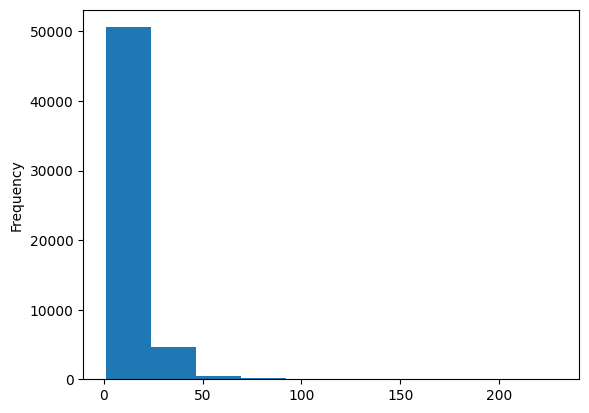

In [44]:
sms_corpus_df['Word Count'].plot.hist()

<Axes: ylabel='Frequency'>

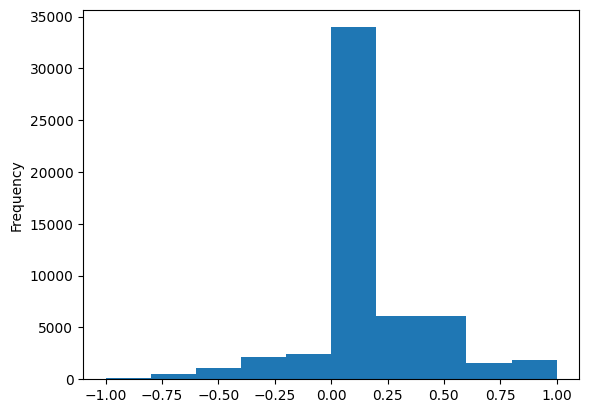

In [45]:
sms_corpus_df['Polarity'] = sentiment_results
sms_corpus_df['Polarity'].plot.hist()

<span style="background-color: #FFFF00; color: #000000">**Class Discussion:** Before you ran these plots, what were you expecting? Now after having seen these plots, what are your thoughts? Is this what you had expected, and why?</span>

### 2.2: Topic modelling

We try with some topic modelling to highlight the challenges of topic modelling with short texts, on top of the difficulties with Singlish texts.

In [46]:
# Step 1: Preprocessing (with stopword removal and lemmatization)
texts_preprocessed = [preprocess(text) for text in sms_corpus_df['Text'].astype('str')]

# Step 2: Vectorizing the text data
vectorizer = CountVectorizer()
dtm = vectorizer.fit_transform(texts_preprocessed)

# Step 3: Applying LDA for Topic Modeling
lda = LatentDirichletAllocation(n_components = 10, random_state = 2024)
lda.fit(dtm)

no_top_words = 10
tf_feature_names = vectorizer.get_feature_names_out()
display_topics(lda, tf_feature_names, no_top_words)

Topic 0:
oh, na, wan, sorry, go, got, love, make, hey, gon
Topic 1:
dear, hee, okay, love, wat, eat, going, le, late, time
Topic 2:
hi, thanks, call, hey, meet, see, coming, please, email, yo
Topic 3:
come, time, home, lor, going, got, go, wat, hey, ur
Topic 4:
ur, ya, happy, go, lol, la, new, year, take, day
Topic 5:
hahaha, haha, yeah, think, got, want, one, bus, still, omg
Topic 6:
haha, le, go, okay, time, hahaha, ah, got, dun, going
Topic 7:
yes, da, ha, hai, decimal, class, outside, msg, ki, se
Topic 8:
know, like, dont, let, sure, sm, good, get, think, day
Topic 9:
ok, lol, yup, lo, one, good, haha, got, need, ya


The topics here look quite bad, but this is unsurprising given how short SMSes are. Topic modelling tends to underperform in these cases. We check this by computing the coherence score as well.

In [47]:
# Step 1: Create a Gensim Dictionary and Corpus
texts_tokenized = [text.split() for text in texts_preprocessed]
dictionary = Dictionary(texts_tokenized)
corpus = [dictionary.doc2bow(text) for text in texts_tokenized]

# Step 2: Get the topics from the LDA model
lda_topics = lda.components_
lda_topics_words = [[vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-10 - 1:-1]] for topic in lda_topics]

# Step 3: Calculate Coherence Score
coherence_model_lda = CoherenceModel(topics = lda_topics_words, 
                                     texts = texts_tokenized, 
                                     dictionary = dictionary, 
                                     coherence = 'c_v')

coherence_lda = coherence_model_lda.get_coherence()
print(f'Coherence Score for LDA Model: {coherence_lda}')

Coherence Score for LDA Model: 0.4927444567712634


One problem with Singlish is the difficulty in tokenising it correctly. Let's take a look by applying BERT's tokeniser to some of the Singlish texts here.

In [48]:
from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained("google-bert/bert-base-uncased")

In [49]:
print(sms_corpus_df['Text'][0])
tokenizer.tokenize(sms_corpus_df['Text'][0])

Bugis oso near wat...


['bug', '##is', 'os', '##o', 'near', 'wat', '.', '.', '.']

In [50]:
print(sms_corpus_df['Text'][36])
tokenizer.tokenize(sms_corpus_df['Text'][36])

ll go yan jiu too... We can skip ard oso, go cine den go mrt one, blah blah blah...


['ll',
 'go',
 'yan',
 'ji',
 '##u',
 'too',
 '.',
 '.',
 '.',
 'we',
 'can',
 'skip',
 'ar',
 '##d',
 'os',
 '##o',
 ',',
 'go',
 'ci',
 '##ne',
 'den',
 'go',
 'mr',
 '##t',
 'one',
 ',',
 'blah',
 'blah',
 'blah',
 '.',
 '.',
 '.']

## 3. Introduction to Large Language Models

In this section, we will use a LLM, specifically Google's **Gemini** model (free tier), to perform the same tasks we did earlier — summarisation, topic classification, and sentiment analysis — and compare the results.

### 3.1 Setup

To use Google's Gemini API, you will need to:
1. Go to [Google AI Studio](https://aistudio.google.com) and sign in with your Google account
2. Generate an API key
3. Create a `.env` file in this directory with the line: `GEMINI_API_KEY=your_key_here`

In [56]:
from dotenv import load_dotenv
import os

# Load environment variables from .env file
load_dotenv()

True

In [57]:
from google import genai

# The client automatically picks up GEMINI_API_KEY from the environment
client = genai.Client(api_key=os.getenv("GEMINI_API_KEY"))

# We'll use Gemini 2.0 Flash — fast, capable, and free
MODEL_ID = "gemini-3-flash-preview"

In [58]:
# Quick test — make sure the API is working
response = client.models.generate_content(model=MODEL_ID, contents="Say hello in one sentence.")
print(response.text)

Hello, how can I help you today?


### 3.2 Summarising Parliamentary Speeches

One of the most immediately useful capabilities of LLMs is summarisation. Let's take a long parliamentary speech and ask Gemini to summarise it. Compare how easy this is versus building a custom extractive or abstractive summariser.

In [59]:
# Pick one of the longest speeches in the dataset
long_speech_idx = hansard_df_cleaned['Speech Length'].idxmax()
long_speech = hansard_df_cleaned.loc[long_speech_idx]

print(f"Speaker: {long_speech['Speaker']}")
print(f"Title: {long_speech['Title']}")
print(f"Word count: {long_speech['Speech Length']}")
print(f"\nFirst 500 characters:\n{long_speech['Speech'][:500]}...")

Speaker: The Second Minister for Law (Mr Edwin Tong Chun Fai)
Title: Committee of Supply – Head R (Ministry of Law)
Word count: 8320

First 500 characters:
Mr Chairman, good morning. I thank the Members for their speeches. Sir, as we emerge from COVID-19, we face both challenges, but also extraordinary opportunities. In terms of challenges, we look at how our legal framework can continue to achieve fairness, remain accessible to all, achieve justice in a changing world and ensure that these legal services remain accessible, available, including to the most vulnerable. But we also face opportunities, on how we can reposition, re-envision and strengt...


In [ ]:
prompt = f"""Summarise the following parliamentary speech in 3-5 bullet points. 
Focus on the key policy issues raised and any questions asked.

Speech:
{long_speech['Speech']}"""

response = client.models.generate_content(model=MODEL_ID, contents=prompt)
print(response.text)

Here is a summary of the key policy issues and questions raised in the speech:

*   **Enhancing Community Dispute Resolution:** In response to questions from Members like Mr. Lim Biow Chuan and Mr. Gerald Giam regarding neighborly nuisance, the Ministry is conducting a comprehensive review of the community dispute management framework. Key policy considerations include making mediation compulsory (rather than voluntary), enhancing the Community Disputes Resolution Tribunal (CDRT) to allow for interim orders, and improving the enforcement of mediated agreements.
*   **Expanding Access to Justice:** To bridge the "justice gap" widened by COVID-19, the Ministry is digitalizing legal aid through the "iLAB" chatbot and a one-stop legal information portal. Addressing concerns from Dr. Tan Wu Meng, the Minister highlighted increased flexibility in means testing for exceptional cases and confirmed that the government is studying the potential establishment of a Public Defender's Office to furt

### 3.3 Zero-Shot Topic Classification

Earlier, we used LDA to assign topics to speeches. This required preprocessing, vectorisation, and hyperparameter tuning. With an LLM, we can simply *describe* the topics and ask the model to classify — no training required. This is called **zero-shot classification**.

In [60]:
# Define topic labels based on the 20-topic LDA results from Section 1.3
topic_labels = [
    "Parliamentary procedure / general debate",
    "Community and youth programmes",
    "Arts, sports, and heritage",
    "Neighbourhood and resident issues",
    "Foreign affairs and defence (ASEAN)",
    "Public governance and women's issues",
    "Transport and public roads",
    "Education and schools",
    "HDB housing and rental",
    "Digital services and smart nation",
    "Government procurement and tax",
    "Business, enterprise, and economy",
    "Food, hawkers, and climate/environment",
    "Healthcare and family support",
    "Workers, jobs, and wages",
    "Drugs, prisons, and rehabilitation",
    "Vehicles and driving",
    "SAF, scams, and security",
    "Legal and judicial matters",
    "Electric vehicles and banking",
]

topic_list_str = "\n".join([f"{i}: {label}" for i, label in enumerate(topic_labels)])
print(topic_list_str)

0: Parliamentary procedure / general debate
1: Community and youth programmes
2: Arts, sports, and heritage
3: Neighbourhood and resident issues
4: Foreign affairs and defence (ASEAN)
5: Public governance and women's issues
6: Transport and public roads
7: Education and schools
8: HDB housing and rental
9: Digital services and smart nation
10: Government procurement and tax
11: Business, enterprise, and economy
12: Food, hawkers, and climate/environment
13: Healthcare and family support
14: Workers, jobs, and wages
15: Drugs, prisons, and rehabilitation
16: Vehicles and driving
17: SAF, scams, and security
18: Legal and judicial matters
19: Electric vehicles and banking


In [61]:
import time

# Sample 3 speeches with reasonable length for classification
sample_df = hansard_df_cleaned[hansard_df_cleaned['Speech Length'] > 100].sample(3, random_state=2024).reset_index(drop=True)

llm_topics = []
for i, row in sample_df.iterrows():
    prompt = f"""Classify the following parliamentary speech into exactly ONE of these topics. 
Respond with ONLY the topic number (0-19), nothing else.

Topics:
{topic_list_str}

Speech:
{row['Speech'][:2000]}"""
    
    response = client.models.generate_content(model=MODEL_ID, contents=prompt)
    llm_topic = response.text.strip()
    llm_topics.append(llm_topic)
    print(f"Speech {i}: LLM says topic {llm_topic} ({topic_labels[int(llm_topic)] if llm_topic.isdigit() else 'INVALID'})")
    time.sleep(5)  # Be polite to the free API

Speech 0: LLM says topic 3 (Neighbourhood and resident issues)
Speech 1: LLM says topic 12 (Food, hawkers, and climate/environment)
Speech 2: LLM says topic 4 (Foreign affairs and defence (ASEAN))


In [62]:
# Compare with LDA's topic assignments for the same speeches
# We need to re-transform these speeches through the LDA pipeline
sample_texts_preprocessed = [preprocess(text) for text in sample_df['Speech']]
sample_dtm = vectorizer.transform(sample_texts_preprocessed)
sample_lda_topics = np.argmax(lda.transform(sample_dtm), axis=1)

comparison = pd.DataFrame({
    'Speech (first 80 chars)': sample_df['Speech'].str[:80],
    'LDA Topic': [f"{t} ({topic_labels[t]})" for t in sample_lda_topics],
    'LLM Topic': [f"{t} ({topic_labels[int(t)] if t.isdigit() else 'INVALID'})" for t in llm_topics],
})
comparison

,Speech (first 80 chars),LDA Topic,LLM Topic
0,"Thank you. Mdm Chair, high-density living is p...",5 (Public governance and women's issues),3 (Neighbourhood and resident issues)
1,"Chairman, during last year's debate, I spoke a...",0 (Parliamentary procedure / general debate),"12 (Food, hawkers, and climate/environment)"
2,"Mr Chairman, 2022 was a very busy year. We han...",8 (HDB housing and rental),4 (Foreign affairs and defence (ASEAN))


<span style="background-color: #FFFF00; color: #000000">**Exercise:** Try modifying the prompt above — for example, ask the model to also provide a one-sentence justification for its choice. How does adding instructions to the prompt change the output? Does the classification quality improve or worsen?</span>

### 3.4 Sentiment Analysis with an LLM

A key advantage of LLMs over traditional sentiment tools is that they can **explain their reasoning**. TextBlob gives you a number; Flair gives you a label and a score. An LLM can tell you *why* it thinks a speech is positive or negative — which is far more useful for policy analysis.

In [63]:
# Let's analyse sentiment for the same speeches we compared earlier
# Recall: "Do you mind repeating? I am sorry." was rated most negative by TextBlob
test_speeches = [
    ("TextBlob most negative", hansard_df_cleaned.loc[hansard_df_cleaned['Polarity'].idxmin(), 'Speech']),
    ("TextBlob most positive", hansard_df_cleaned.loc[hansard_df_cleaned['Polarity'].idxmax(), 'Speech']),
    ("Flair most negative", hansard_df_cleaned.loc[hansard_df_cleaned['Sentiment'].idxmin(), 'Speech'][:2000]),
]

for label, speech in test_speeches:
    prompt = f"""Analyse the sentiment of this parliamentary speech. 
Provide:
1. A sentiment score from -1.0 (very negative) to 1.0 (very positive)
2. A one-sentence explanation of your reasoning

Format your response exactly as:
Score: [number]
Reason: [explanation]

Speech:
{speech}"""
    
    response = client.models.generate_content(model=MODEL_ID, contents=prompt)
    print(f"=== {label} ===")
    print(f"Speech: {speech[:100]}...")
    print(response.text)
    print()
    time.sleep(1)

=== TextBlob most negative ===
Speech: Do you mind repeating? I am sorry....
Score: 0.0
Reason: The speaker is making a polite, functional request for clarification without expressing any underlying emotional bias or opinion.

=== TextBlob most positive ===
Speech: So, for ComLink to be successful, there must be clarity, competence and commitment....
Score: 0.6
Reason: The speaker uses constructive and aspirational language, emphasizing positive attributes like clarity, competence, and commitment as the necessary drivers for success.

=== Flair most negative ===
Speech: Sir, for the past few years, I have been asking HDB to review the policy of not allowing singles to ...
Score: -0.4
Reason: The speaker expresses concern and criticism by highlighting the interpersonal conflicts, social hardships, and policy shortcomings experienced by vulnerable singles in the public rental system.



<span style="background-color: #FFFF00; color: #000000">**Class Discussion:** Compare the LLM's sentiment analysis with TextBlob and Flair's results. Notice how the LLM correctly identifies that "Do you mind repeating? I am sorry." is a neutral/polite request, not a negative statement. What does this tell us about the limitations of dictionary-based and embedding-based approaches for domain-specific text like parliamentary speeches?</span>

### 3.5 Handling Singlish with LLMs

In Section 2, we saw that BERT's tokeniser struggles with Singlish — splitting words like "Bugis" and "oso" into meaningless subword tokens. The LDA topic model also produced poor results on SMS data. LLMs trained on diverse internet text (including forums, social media, and chat) tend to handle colloquial language much better. Let's test this.

In [64]:
# Pick some Singlish-heavy SMS messages
singlish_samples = [
    sms_corpus_df['Text'][0],   # "Bugis oso near wat..."
    sms_corpus_df['Text'][3],   # "Den only weekdays got special price... Haiz..."
    sms_corpus_df['Text'][36],  # "ll go yan jiu too... We can skip ard oso..."
]

for sms in singlish_samples:
    prompt = f"""This is a Singlish SMS message from Singapore. Please:
1. Translate it to standard English
2. Rate the sentiment from -1.0 (very negative) to 1.0 (very positive)

Format your response as:
Translation: [standard English version]
Sentiment: [score]

SMS: {sms}"""
    
    response = client.models.generate_content(model=MODEL_ID, contents=prompt)
    print(f"Original: {sms}")
    print(response.text)
    print()
    time.sleep(1)

Original: Bugis oso near wat...
Translation: Bugis is also quite nearby.
Sentiment: 0.2

Original: Den only weekdays got special price... Haiz... Cant eat liao... Cut nails oso muz wait until i finish drivin wat, lunch still muz eat wat...
Translation: The special price is only available on weekdays. *Sigh*. I won't be able to eat there then. I also have to wait until I finish driving to cut my nails, but I still have to eat lunch anyway.

Sentiment: -0.4

Original: ll go yan jiu too... We can skip ard oso, go cine den go mrt one, blah blah blah...
Translation: I will look into it as well. We can also hop around, go to Cineleisure then go to the one near the MRT station, and so on.
Sentiment: 0.5



In [65]:
# Compare with TextBlob's polarity on the same messages
for sms in singlish_samples:
    doc = nlp(sms)
    print(f"SMS: {sms}")
    print(f"TextBlob Polarity: {doc._.blob.polarity:.3f}")
    print()

SMS: Bugis oso near wat...
TextBlob Polarity: 0.100

SMS: Den only weekdays got special price... Haiz... Cant eat liao... Cut nails oso muz wait until i finish drivin wat, lunch still muz eat wat...
TextBlob Polarity: 0.179

SMS: ll go yan jiu too... We can skip ard oso, go cine den go mrt one, blah blah blah...
TextBlob Polarity: 0.000



<span style="background-color: #FFFF00; color: #000000">**Class Discussion:** How well does the LLM handle Singlish compared to TextBlob and BERT's tokeniser? What are the implications for NLP work in Singapore's multilingual context? Think about scenarios in the public sector where you might encounter Singlish text (e.g. social media feedback, community forums, helpline transcripts).</span>